In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%pip install numpy-stl

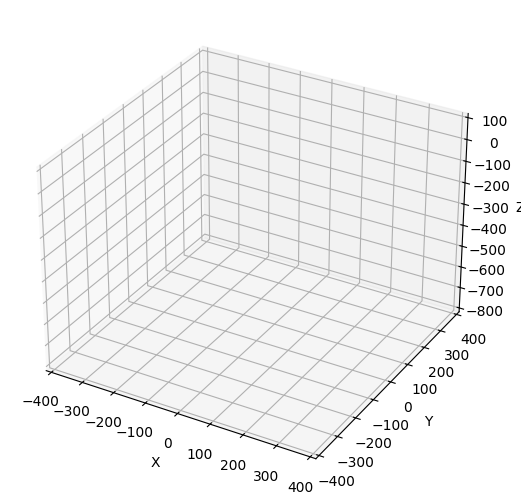

In [3]:

from stl import mesh
from mpl_toolkits import mplot3d
from matplotlib import pyplot as plt, animation
import numpy as np
from IPython.display import HTML

plt.rcParams['animation.embed_limit'] = 50.0 

# Create a new plot
figure = plt.figure()
axes = mplot3d.Axes3D(figure)
figure.add_axes(axes)

# Load the STL files and add the vectors to the plot
mesh_data1 = mesh.Mesh.from_file("cylinder.stl")
midPosRel1 = (mesh_data1.max_ - mesh_data1.min_) / 2
mesh_data1.x = mesh_data1.x - (midPosRel1[0] + mesh_data1.min_[0])
mesh_data1.y = mesh_data1.y - (midPosRel1[1] + mesh_data1.min_[1])
mesh_data1.z = mesh_data1.z - mesh_data1.min_[2]
mesh_data1_height = mesh_data1.max_[2] - mesh_data1.min_[2]

mesh_data2 = mesh.Mesh.from_file("cylinder.stl")
midPosRel2 = (mesh_data2.max_ - mesh_data2.min_) / 2
mesh_data2.x = mesh_data2.x - (midPosRel2[0] + mesh_data2.min_[0])
mesh_data2.y = mesh_data2.y - (midPosRel2[1] + mesh_data2.min_[1])
mesh_data2.z = mesh_data2.z - mesh_data2.min_[2]

# 原点を中心に180度回転
mesh_data1.rotate([0.0, 1.0, 0.0], np.radians(180))
mesh_data2.rotate([0.0, 1.0, 0.0], np.radians(180))

xmin, xmax = -400, 400
ymin, ymax = -400, 400
zmin, zmax = -800, 100
axes.set_xlim3d(xmin, xmax)


axes.set_xlabel("X")
axes.set_ylim3d(ymin, ymax)
axes.set_ylabel("Y")
axes.set_zlim3d(zmin, zmax)
axes.set_zlabel("Z")


def update(angles):
    theta1, theta2 = angles
    axes.cla()
    axes.set_xlim3d(xmin, xmax)
    axes.set_xlabel("X")
    axes.set_ylim3d(ymin, ymax)
    axes.set_ylabel("Y")
    axes.set_zlim3d(zmin, zmax)
    axes.set_zlabel("Z")
    mesh_data1.rotate([0.0, 1.0, 0.0], np.radians(theta1))
    axes.add_collection3d(mplot3d.art3d.Poly3DCollection(mesh_data1.vectors)) 

    
    mesh_data2.rotate([0.0, 1.0, 0.0], np.radians(theta2))
    mesh_data2.translate(np.array([np.sin(np.radians(theta1)) * mesh_data1_height, 0, -1 * np.cos(np.radians(theta1)) * mesh_data1_height]))
    axes.add_collection3d(mplot3d.art3d.Poly3DCollection(mesh_data2.vectors))

    mesh_data1.rotate([0.0, 1.0, 0.0], np.radians(-1 * theta1))
    mesh_data2.translate(np.array([-1 * np.sin(np.radians(theta1)) * mesh_data1_height, 0, np.cos(np.radians(theta1)) * mesh_data1_height]))
    mesh_data2.rotate([0.0, 1.0, 0.0], np.radians(-1 * theta2))

    

In [4]:
import scipy.integrate as RK45
import numpy as np

g = 9.81

omega1_0 = 0
omega2_0 = 0

theta1_0 = np.pi * 2 / 3
theta2_0 = np.pi * 2 / 3

l1 = 0.5
l2 = 0.5

a1 = l1 / 2
a2 = l2 / 2

m1 = 1
m2 = 1

I1 = m1 * l1**2 / 12
I2 = m2 * l2**2 / 12
I12 = I1 + m1 * a1**2 + m2 * l1**2
I22 = I2 + m2 * a2**2

t_0 = 0
t_max = 20
t_sample = t_max * 10

init = np.array([omega1_0, omega2_0, theta1_0, theta2_0])
t_span = (t_0, t_max)
t_eval = np.linspace(t_0, t_max, t_sample)


def func(t, Y):
    (omega1, omega2, theta1, theta2) = Y

    def omega1_dot(t, omega1, omega2, theta1, theta2):
        s1 = -m2 * l1 * a2 * np.sin(theta1 - theta2) * I22 * omega2**2
        s2 = (
            -(m2**2)
            * l1**2
            * a2**2
            * np.sin(theta1 - theta2)
            * np.cos(theta1 - theta2)
            * omega1**2
        )
        s3 = -(m1 * a1 + m2 * l1) * g * np.sin(theta1) * I22
        s4 = m2**2 * g * l1 * a2**2 * np.cos(theta1 - theta2) * np.sin(theta2)

        s5 = I12 * I22 - m2**2 * l1**2 * a2**2 * np.cos(theta1 - theta2) ** 2

        return (s1 + s2 + s3 + s4) / s5

    def omega2_dot(t, omega1, omega2, theta1, theta2):
        s1 = (
            -m2
            * l1**2
            * a2**2
            * np.cos(theta1 - theta2)
            * np.sin(theta1 - theta2)
            * omega2**2
        )
        s2 = -I12 * m2 * l1 * a2 * np.sin(theta1 - theta2) * omega1**2
        s3 = (
            -(m1 * a1 + m2 * l1)
            * m2
            * l1
            * a2
            * g
            * np.sin(theta1)
            * np.cos(theta1 - theta2)
        )
        s4 = I12 * m2 * g * a2 * np.sin(theta2)
        s5 = m2**2 * l1**2 * a2**2 * np.cos(theta1 - theta2) ** 2 - I12 * I22
        return (s1 + s2 + s3 + s4) / s5

    def theta1_dot(t, omega1, omega2, theta1, theta2):
        return omega1

    def theta2_dot(t, omega1, omega2, theta1, theta2):
        return omega2

    return np.array(
        [
            omega1_dot(t, omega1, omega2, theta1, theta2),
            omega2_dot(t, omega1, omega2, theta1, theta2),
            theta1_dot(t, omega1, omega2, theta1, theta2),
            theta2_dot(t, omega1, omega2, theta1, theta2),
        ]
    )


sol = RK45.solve_ivp(func, t_span, init, t_eval=t_eval)

theta1_list = sol.y[2]
theta2_list = sol.y[3]

In [5]:
angles = [
    [theta1 * 180 / np.pi, theta2 * 180 / np.pi]
    for theta1, theta2 in zip(theta1_list, theta2_list)
]

anim = animation.FuncAnimation(figure, update, frames=angles, interval=100)
HTML(anim.to_jshtml())

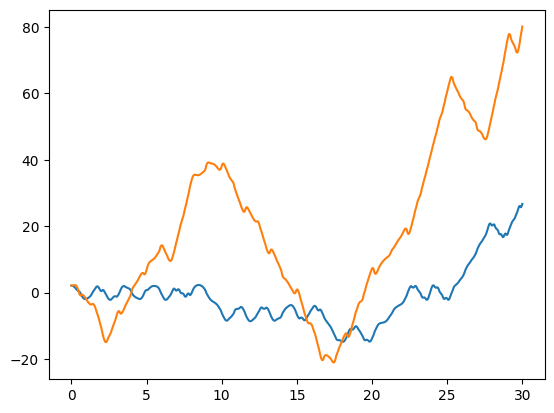

In [97]:
from random import randint

# グラフの描画
plt.plot(t_eval, theta1_list)
plt.plot(t_eval, theta2_list)
plt.show()